In [ ]:
%pip install cleanvision

In [48]:
import os
from utils import move_to_new_dir
from pathlib import Path

source_dir = Path("/home/cs2r/Downloads/Final_Data")
destination_dir = Path("/home/cs2r/Downloads/Images_with_Issues")

## [Basic Usage of cleanvision](https://cleanvision.readthedocs.io/en/latest/index.html#basic-usage)

Reading images from /home/cs2r/Downloads/Final_Data/images
Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/276543 [00:00<?, ?it/s]

  0%|          | 0/276543 [00:00<?, ?it/s]

Issue checks completed. 277741 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Removing near_duplicates from potential issues in the dataset as it exceeds max_prevalence=0.5 
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  1 | exact_duplicates |        39595 |
|  2 | blurry           |         1454 |
|  3 | dark             |         1435 |
|  4 | low_information  |          502 |
|  5 | light            |            0 |
|  6 | odd_aspect_ratio |            0 |
|  7 | grayscale        |            0 |
|  8 | odd_size         |            0 | 

----------------- exact_duplicates images ------------------

Number of examples with this issue: 39595
Examples representing most severe instances of this issue:

Set: 0


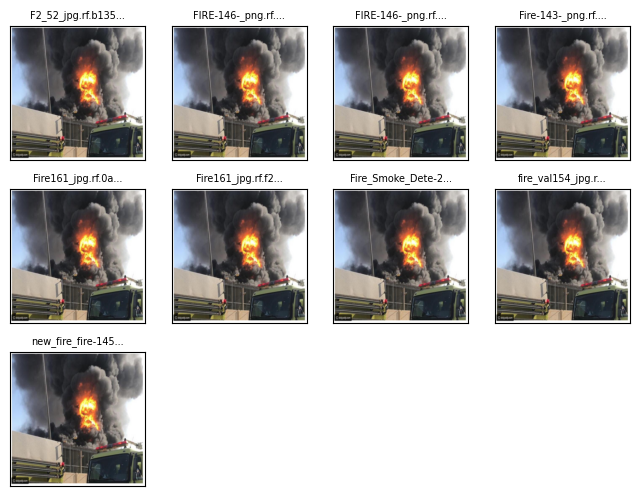

Set: 1


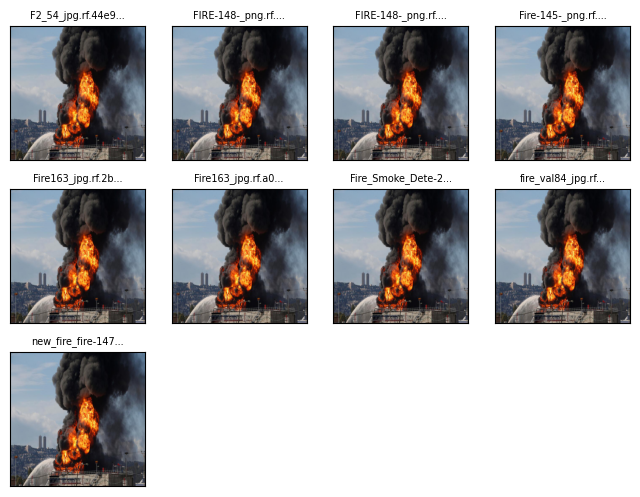

Set: 2


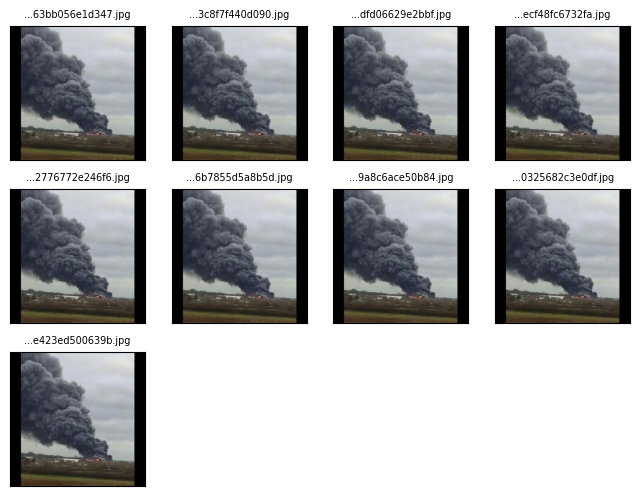

Set: 3


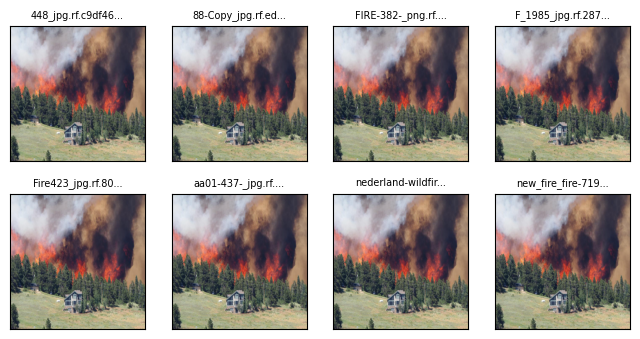

---------------------- blurry images -----------------------

Number of examples with this issue: 1454
Examples representing most severe instances of this issue:



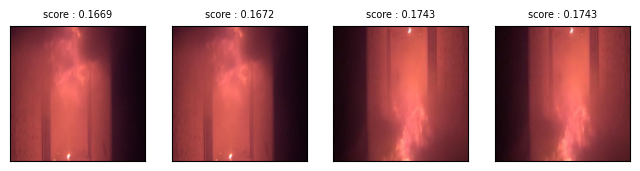

----------------------- dark images ------------------------

Number of examples with this issue: 1435
Examples representing most severe instances of this issue:



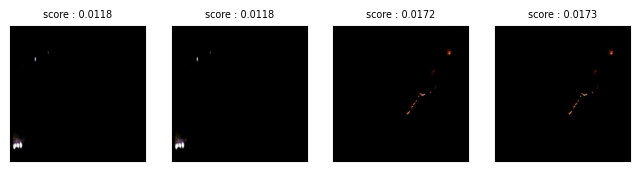

------------------ low_information images ------------------

Number of examples with this issue: 502
Examples representing most severe instances of this issue:



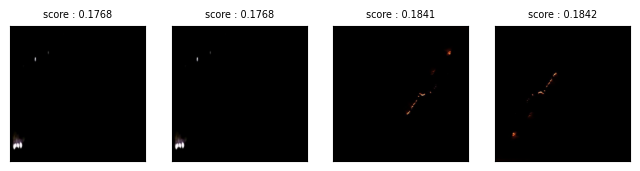

In [2]:
from cleanvision import Imagelab

# Specify path to folder containing the image files in your dataset
imagelab = Imagelab(data_path="/home/cs2r/Downloads/Final_Data/images")

# Automatically check for a predefined list of issues within your dataset
imagelab.find_issues()

# Produce a neat report of the issues found in your dataset
imagelab.report()

## Summary of all detected issue types 

In [4]:
imagelab.issue_summary

,issue_type,num_images
0,near_duplicates,234755
1,exact_duplicates,39595
2,blurry,1454
3,dark,1435
4,low_information,502
5,light,0
6,odd_aspect_ratio,0
7,grayscale,0
8,odd_size,0


In [5]:
imagelab.issues.head()

,odd_size_score,is_odd_size_issue,odd_aspect_ratio_score,is_odd_aspect_ratio_issue,low_information_score,is_low_information_issue,light_score,is_light_issue,grayscale_score,is_grayscale_issue,dark_score,is_dark_issue,blurry_score,is_blurry_issue,exact_duplicates_score,is_exact_duplicates_issue,near_duplicates_score,is_near_duplicates_issue
/home/cs2r/Downloads/Final_Data/images/-1-_jpeg_jpg.rf.16ed22750c65aa380269fcaccf177489.jpg,1.0,False,1.0,False,0.843185,False,0.950413,False,1,False,0.982683,False,0.596735,False,1.0,False,1.000000,False
/home/cs2r/Downloads/Final_Data/images/-1-_jpeg_jpg.rf.447fa09737a3669916f3f684a59decce.jpg,1.0,False,1.0,False,0.843136,False,0.950413,False,1,False,0.982683,False,0.596713,False,1.0,False,1.000000,False
/home/cs2r/Downloads/Final_Data/images/-1-_jpg.rf.eef0725df081f92674e3519e926828a7.jpg,1.0,False,1.0,False,0.914179,False,0.902082,False,1,False,0.849017,False,0.376699,False,1.0,False,0.333333,True
/home/cs2r/Downloads/Final_Data/images/-10-_jpg.rf.f39ef4204034ccf8c69f6c89c841e7cb.jpg,1.0,False,1.0,False,0.908392,False,0.859697,False,1,False,0.834632,False,0.452398,False,1.0,False,1.000000,False
/home/cs2r/Downloads/Final_Data/images/-109170_png.rf.ead26d133fbf78a99a04a8779bacbbc6.jpg,1.0,False,1.0,False,0.835948,False,0.778441,False,1,False,0.773795,False,0.556946,False,1.0,False,0.500000,True


## Visualize the blurry images

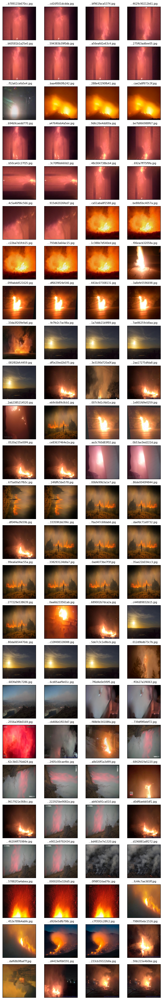

In [42]:
blurry_images = imagelab.issues[imagelab.issues["is_blurry_issue"] == True].sort_values(
    by=["blurry_score"]
)
blurry_image_files = blurry_images.index.tolist()
imagelab.visualize(image_files=blurry_image_files[:100])

### Remove the blurry images from the dataset and move them to new dirdirectory 

In [43]:
destination_dir_blurry = destination_dir / "Blurry"
move_to_new_dir.move(blurry_image_files, source_dir, destination_dir_blurry)

Images and labels moved successfully.


## Visualize the Low information images

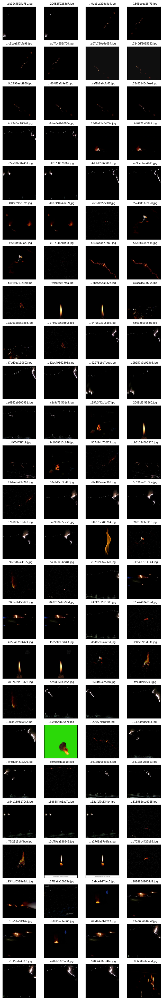

In [44]:
low_information_images = imagelab.issues[
    imagelab.issues["is_low_information_issue"] == True
].sort_values(by=["low_information_score"])
low_information_files = low_information_images.index.tolist()
imagelab.visualize(image_files=low_information_files[:100])

### Remove low_information images from the dataset and move them to new dirdirectory 

In [45]:
destination_dir_low_information = destination_dir / "Low_information"
move_to_new_dir.move(low_information_files, source_dir, destination_dir_low_information)

Images and labels moved successfully.


## Visualize the Dark images

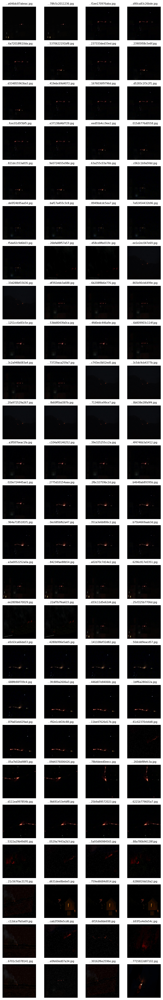

In [49]:
dark_images = imagelab.issues[imagelab.issues["is_dark_issue"] == True].sort_values(
    by=["dark_score"]
)
dark_image_files = dark_images.index.tolist()
# Filter out the missing files, since we remove some of the dark images to in previous call i.e image can be low_infirnarion and dark
existing_dark_image_files = [file for file in dark_image_files if os.path.exists(file)]
imagelab.visualize(image_files=existing_dark_image_files[:100])

### Remove Dark images from the dataset and move them to new dirdirectory 

In [50]:
destination_dir_dark = destination_dir / "Dark"
move_to_new_dir.move(existing_dark_image_files, source_dir, destination_dir_dark)

Images and labels moved successfully.


## Visualize the Exact Duplicates images

Set: 0


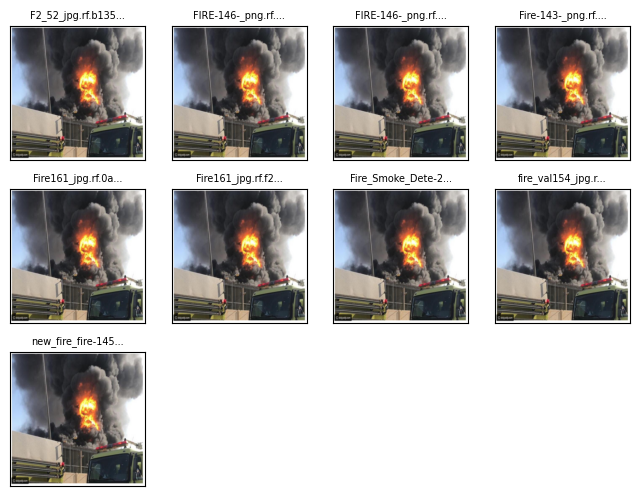

Set: 1


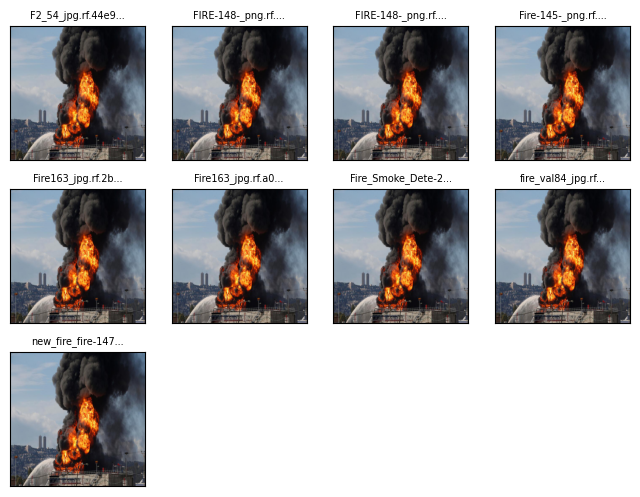

Set: 2


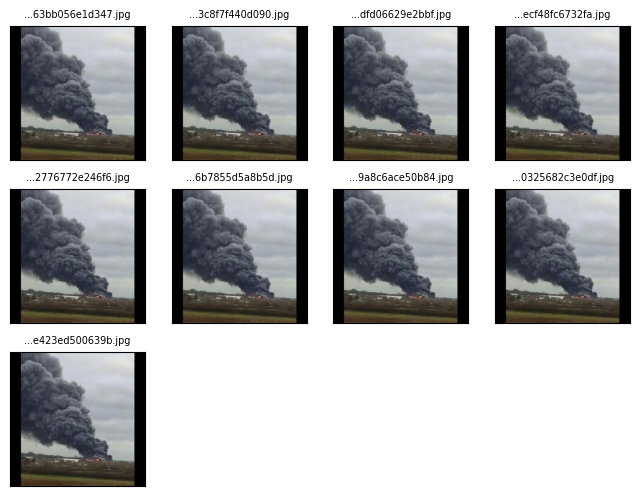

Set: 3


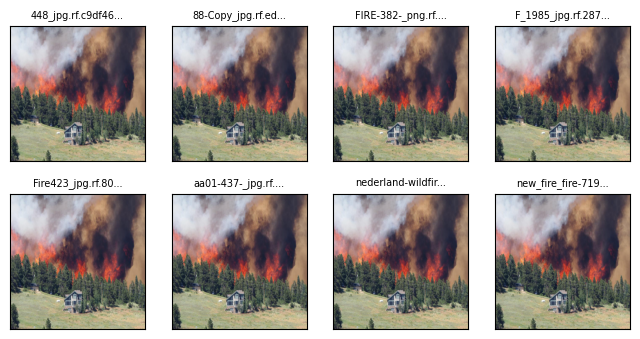

Set: 4


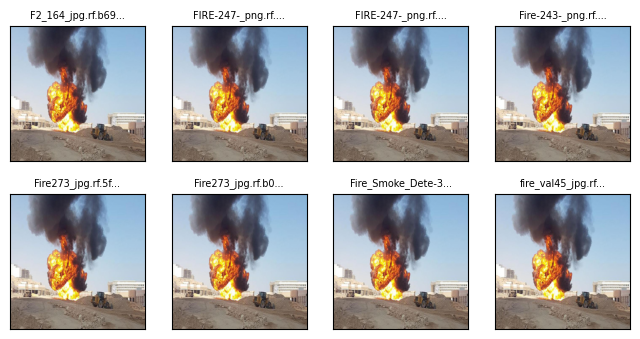

Set: 5


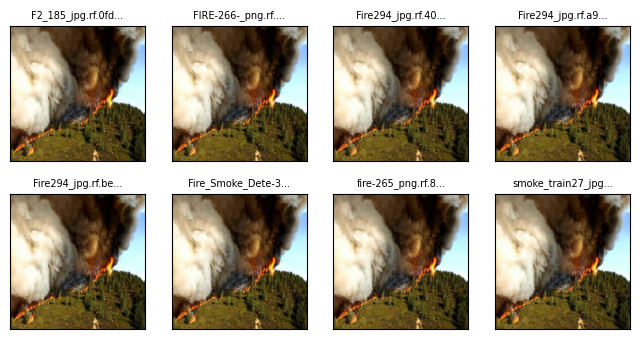

Set: 6


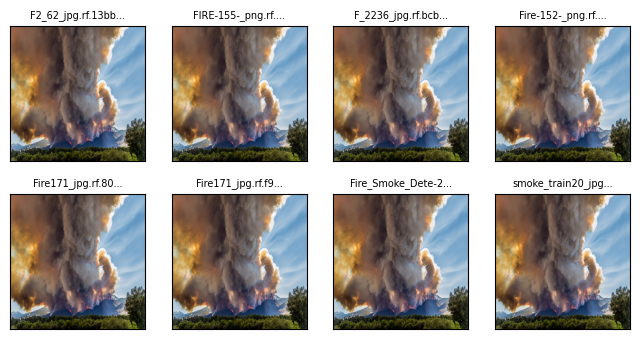

Set: 7


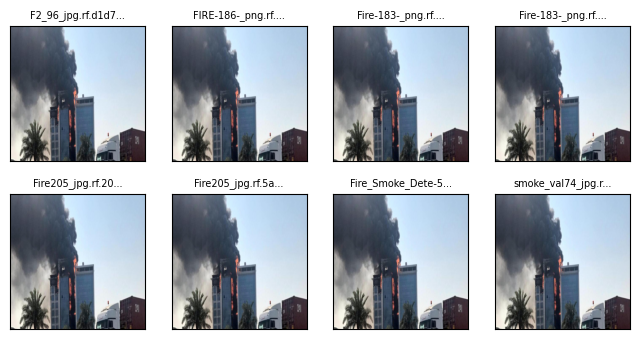

Set: 8


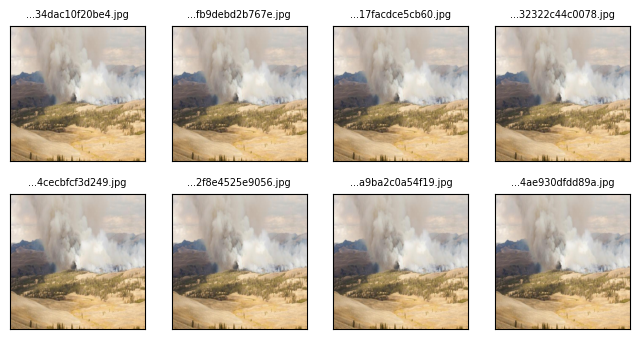

Set: 9


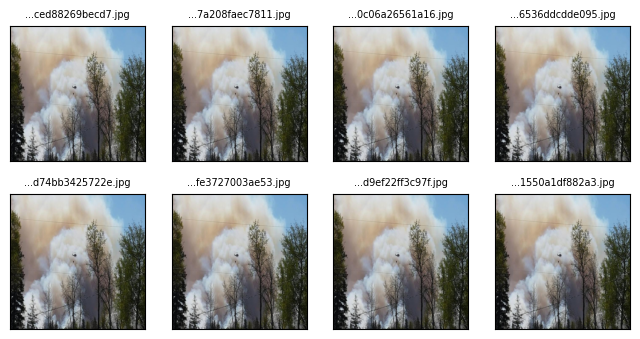

Set: 10


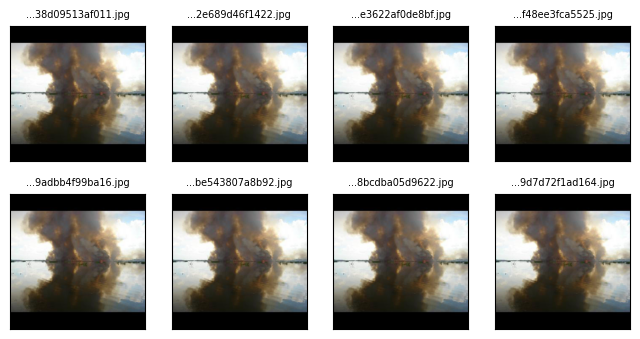

Set: 11


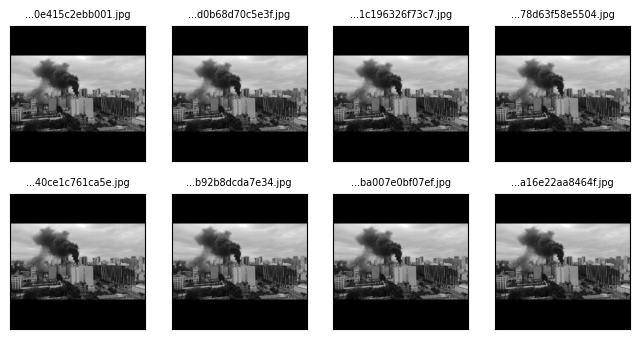

Set: 12


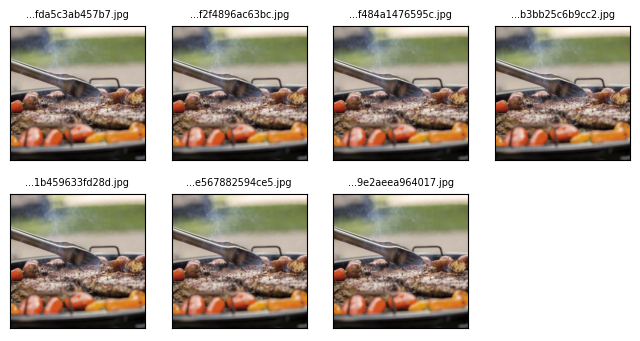

Set: 13


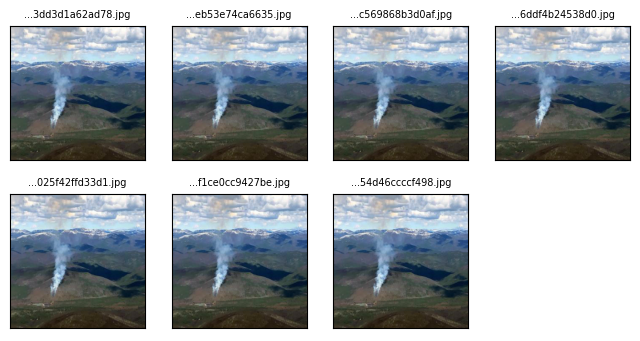

Set: 14


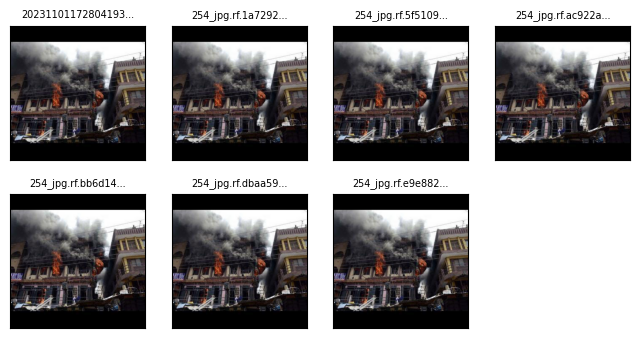

Set: 15


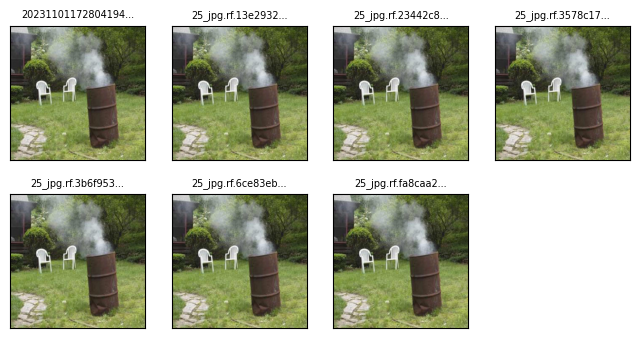

Set: 16


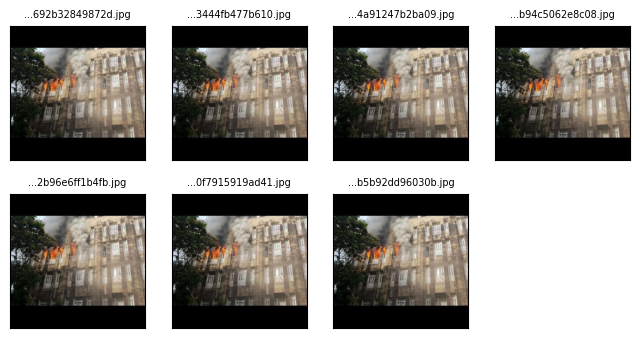

Set: 17


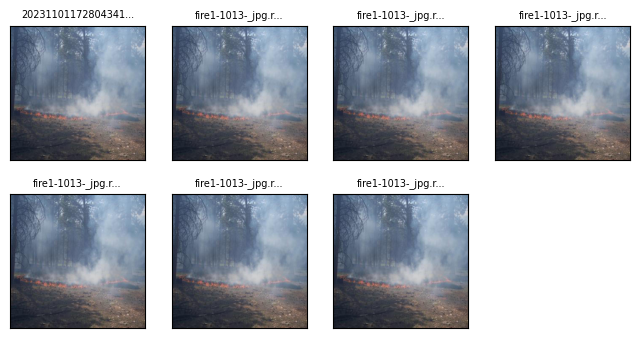

Set: 18


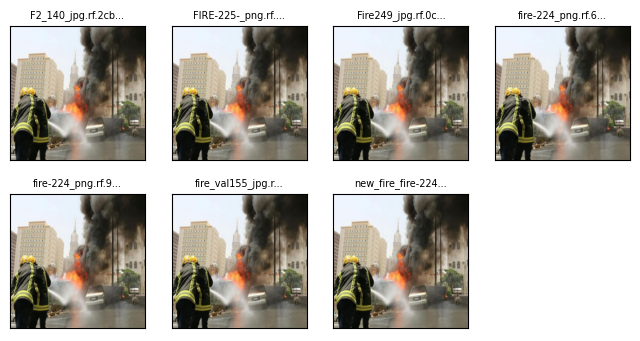

Set: 19


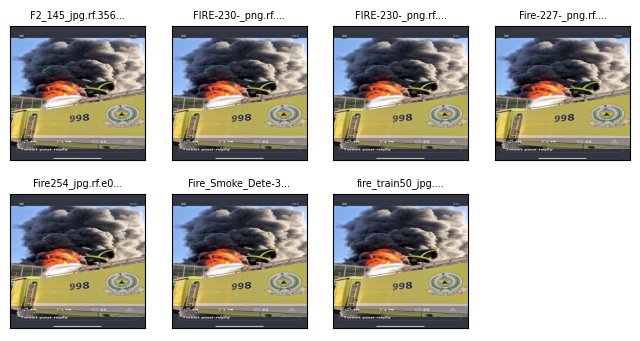

Set: 20


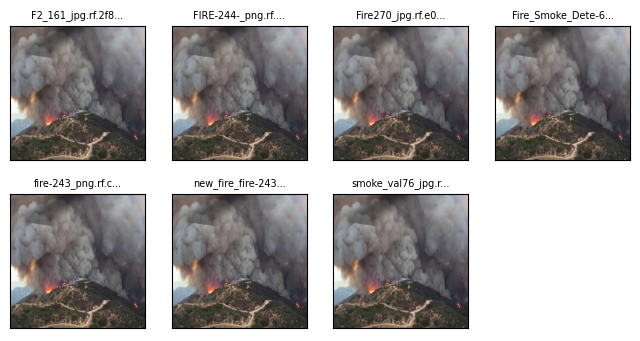

Set: 21


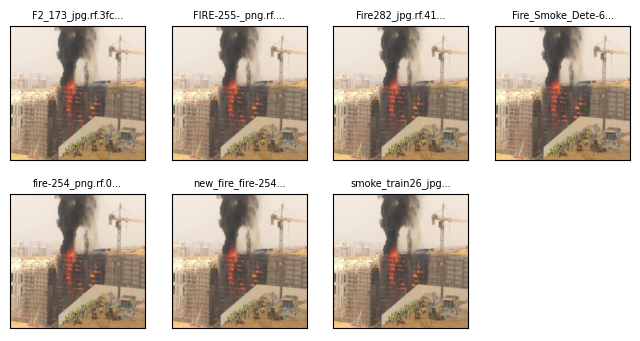

Set: 22


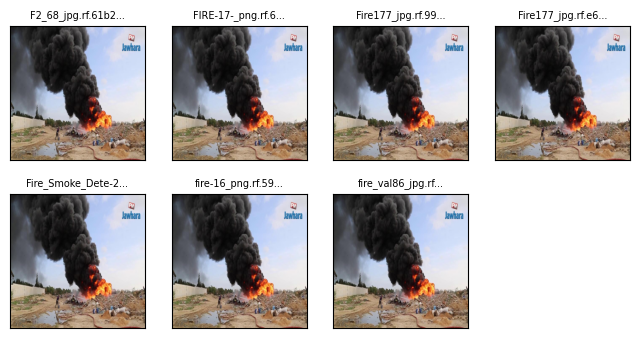

Set: 23


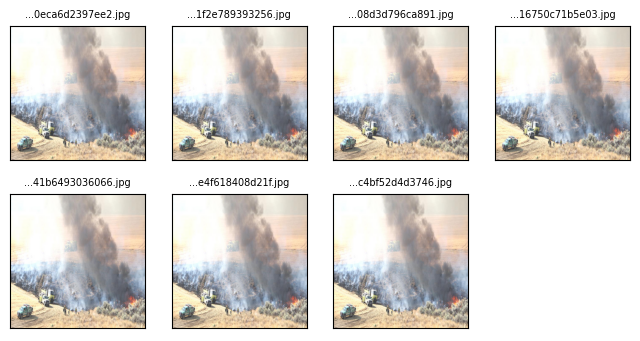

Set: 24


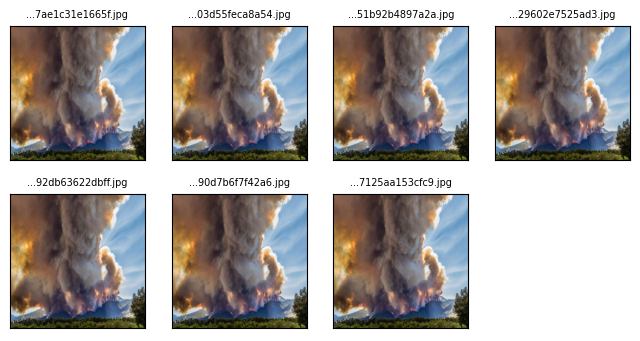

Set: 25


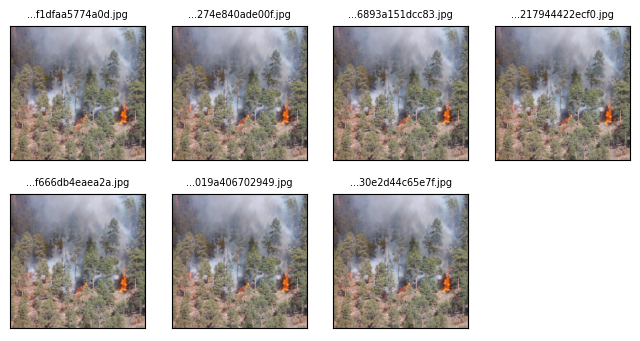

Set: 26


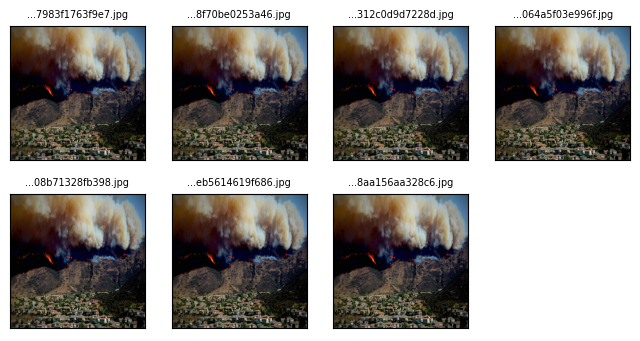

Set: 27


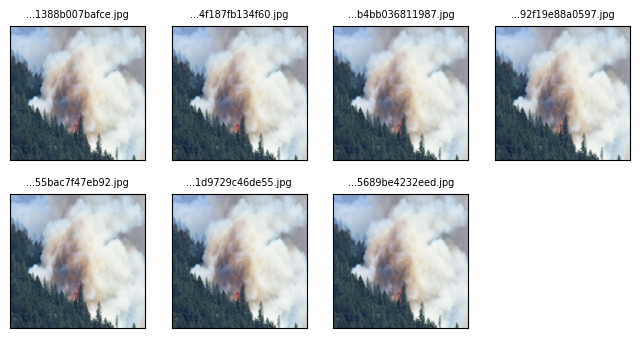

Set: 28


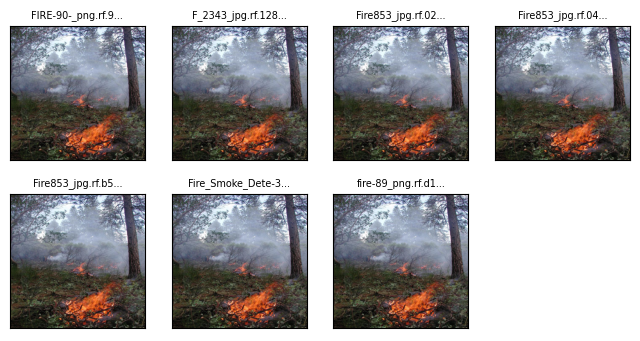

Set: 29


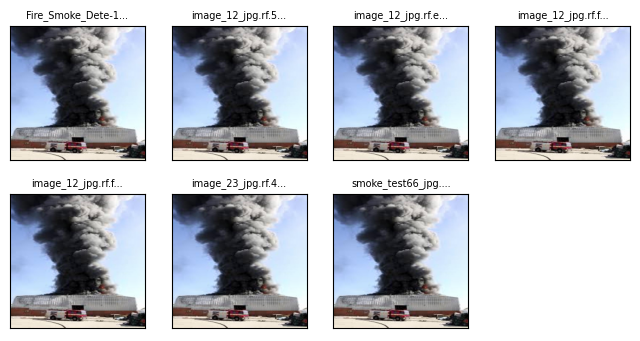

Set: 30


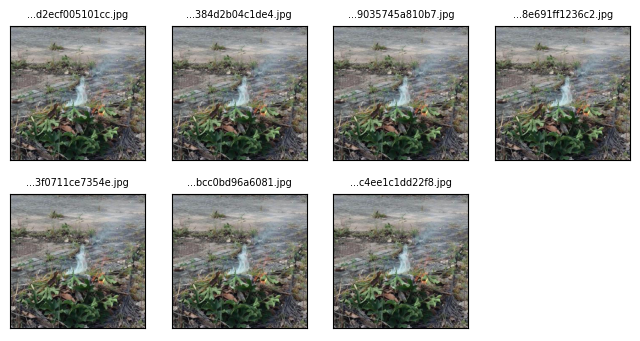

Set: 31


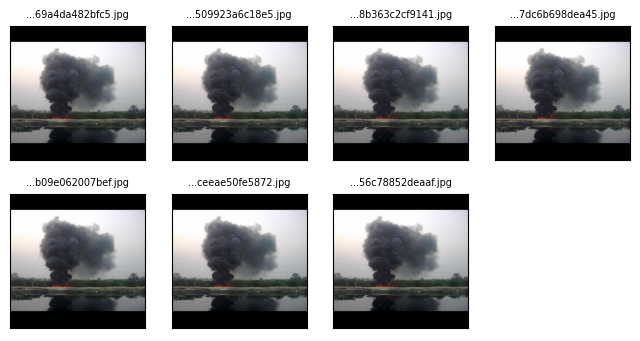

Set: 32


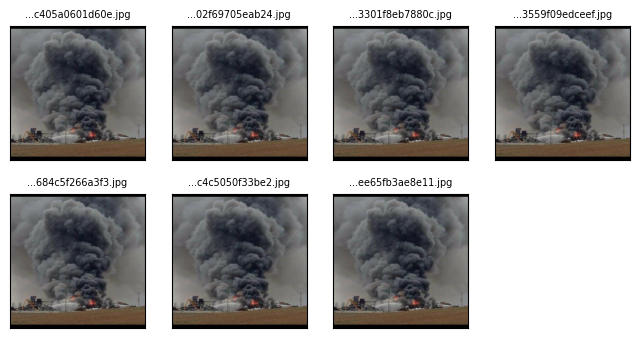

Set: 33


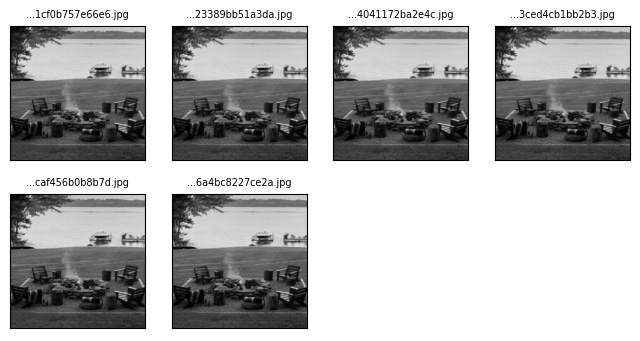

Set: 34


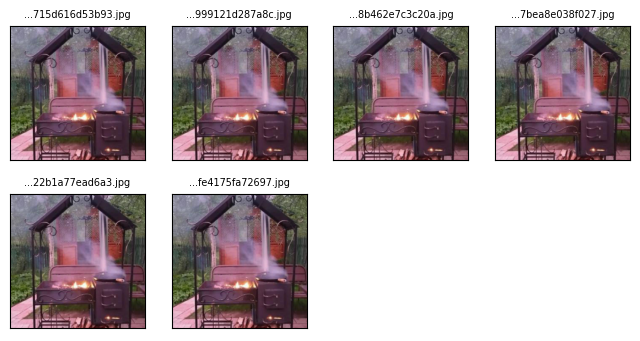

Set: 35


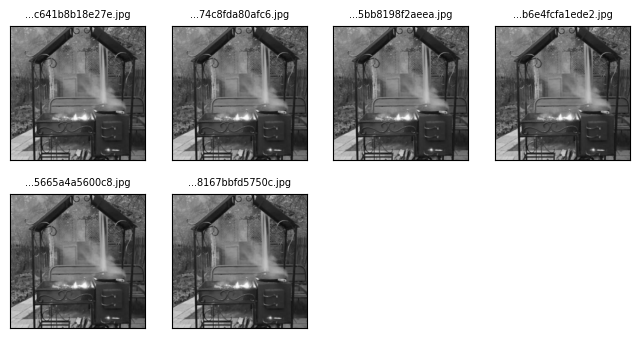

Set: 36


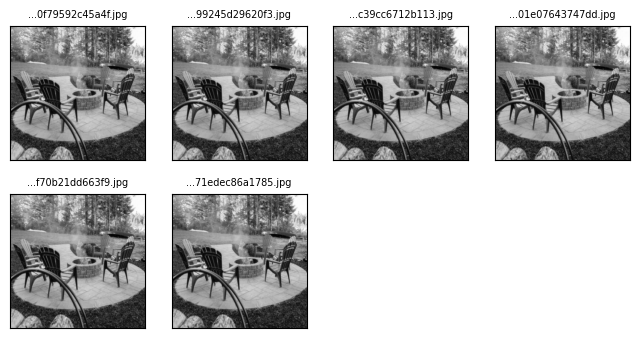

Set: 37


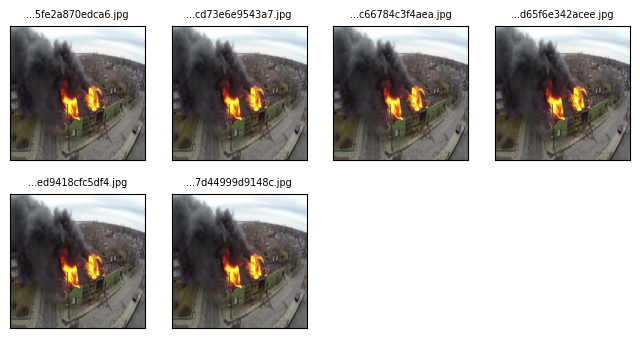

Set: 38


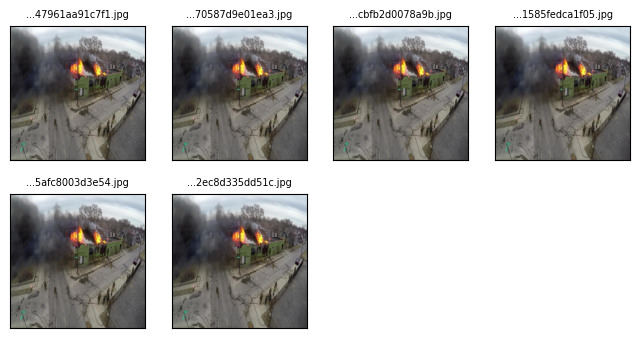

Set: 39


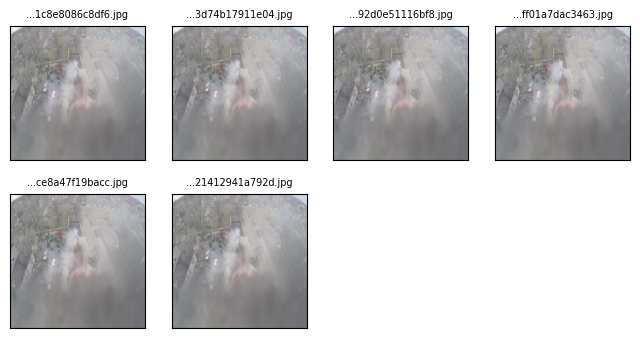

In [83]:
exact_duplicates_images = imagelab.issues[imagelab.issues["is_exact_duplicates_issue"] == True].sort_values(
    by=["exact_duplicates_score"]
)
exact_duplicates_files = exact_duplicates_images.index.tolist()

existing_exact_duplicates_files = [file for file in exact_duplicates_files if os.path.exists(file)]

imagelab.visualize(issue_types=["exact_duplicates"] , num_images=40)

### Remove exact_duplicates images from the dataset and move them to new dirdirectory 

In [84]:
destination_dir_exact_duplicates = destination_dir / "Exact_duplicates"
move_to_new_dir.move(existing_exact_duplicates_files, source_dir, destination_dir_exact_duplicates)

Images and labels moved successfully.


#### In the above cell we remove all the exact_duplicates images to new dir, but we don't went that
#### we want to save one image from every set, so if we have 3 duplicates move 2 and keep 1.

In [90]:
sets_len = imagelab.info["exact_duplicates"]["num_sets"]
images_path = []

for i in range(sets_len):
    images_path.append(imagelab.info["exact_duplicates"]["sets"][i][0])
    
    
print(f"From the total exact_duplicates images: {len(exact_duplicates_images)}, Found: {len(images_path)} unique images")
 

From the total exact_duplicates images: 39595, Found: 17850 unique images


In [95]:
import os
import shutil

def move_specified_files(file_names, source_dir, destination_dir):
    """
    Move specified images and their corresponding labels to new directories.

    Parameters:
    file_names (list): List of image file names.
    source_dir (str): Base directory containing the original images and labels.
    destination_dir (str): Base directory where files will be moved.
    """
    # Define source and destination directories for images and labels
    source_images_dir = os.path.join(source_dir, 'images')
    source_labels_dir = os.path.join(source_dir, 'labels')
    
    destination_images_dir = os.path.join(destination_dir, 'images')
    destination_labels_dir = os.path.join(destination_dir, 'labels')
    
    # Create destination directories if they don't exist
    if not os.path.exists(destination_images_dir):
        os.makedirs(destination_images_dir)
        
    if not os.path.exists(destination_labels_dir):
        os.makedirs(destination_labels_dir)

    # Move specified images and their corresponding labels
    for file_name in file_names:
        # Source paths
        source_image_path = os.path.join(source_images_dir, file_name)
        label_name = os.path.splitext(file_name)[0] + '.txt'
        source_label_path = os.path.join(source_labels_dir, label_name)
        
        # Destination paths
        destination_image_path = os.path.join(destination_images_dir, file_name)
        destination_label_path = os.path.join(destination_labels_dir, label_name)
        
        # Move image if it exists
        if os.path.exists(source_image_path):
            shutil.move(source_image_path, destination_image_path)
        
        # Move label if it exists
        if os.path.exists(source_label_path):
            shutil.move(source_label_path, destination_label_path)

    print("Specified images and labels moved successfully.")



source_dir = '/home/cs2r/Downloads/Images_with_Issues/Exact_duplicates'
destination_dir = '/home/cs2r/Downloads/Final_Data'

move_specified_files(image_names, source_dir, destination_dir)


Specified images and labels moved successfully.
